In [1]:
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
import warnings

warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
from harmony import harmonize
from sklearn.utils import shuffle
import copy
import matplotlib as mpl
import matplotlib.pyplot as plt
import anndata as ad
from anndata import AnnData
import seaborn as sns

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=160, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==2.0.2 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10


In [3]:
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
mpl.rcParams.update(new_rc_params)
plt.rcParams.update({'axes.labelsize' : 16}) 

In [4]:
def plot_multidotplot(adatas, cmaps, groupby, group_order, gene_order, stack='v', vmin=0, vmax=2, dot_min=0, dot_max=1, adata_names=None, save='multidotplot.png', size_exp=1.5, vline_locs=[]):
    adatas = list(reversed(adatas))
    cmaps = list(reversed(cmaps))
    num_adatas = len(adatas)

    if isinstance(adata_names, type(None)):
        adata_names = [str(i+1) for i in range(num_adatas)]
    else:
        if len(adata_names) != num_adatas:
            raise Exception('adata_names does not match the length of adatas')
        adata_names = list(reversed([str(i) for i in adata_names]))

    mean_dfs = []
    dot_size_dfs = []
    for i in range(num_adatas):
        adata = adatas[i]
        genedf = sc.get.obs_df(
            adata,
            keys=[groupby, *gene_order],
            use_raw=True
        )
        grouped = genedf.groupby(groupby, observed=True)
        mean_df = grouped.mean()
        
        genedf_bool = genedf.copy()
        genedf_bool[gene_order] = genedf[gene_order] > 0
        dot_size_df = genedf.copy()
        dot_size_df = genedf_bool.groupby(groupby, observed=True).sum()/genedf_bool.groupby(groupby, observed=True).count()

        mean_dfs.append(mean_df)
        dot_size_dfs.append(dot_size_df)

    xs = []
    ys = []
    if stack == 'v':
        for i in range(num_adatas):
            xs_single = []
            ys_single = []
            for j in range(len(gene_order)):
                ys_single.append((num_adatas*(j+1)-(num_adatas-i-1))*np.ones(len(group_order)))
                xs_single.append(np.ones(len(group_order))+np.arange(len(group_order)))
            xs.append(xs_single)
            ys.append(ys_single)
    elif stack == 'h':
        for i in range(num_adatas):
            xs_single = []
            ys_single = []
            for j in range(len(gene_order)):
                ys_single.append((j+1)*np.ones(len(group_order)))
                xs_single.append((i+1)*np.ones(len(group_order))+num_adatas*np.arange(len(group_order)))
            xs.append(xs_single)
            ys.append(ys_single)
        xs = list(reversed(xs))
    else:
        raise Exception('stack must be \'v\' or \'h\'')

    if stack == 'v':
        fig_width = len(group_order)/3
        fig_height = num_adatas*len(gene_order)/3
    elif stack == 'h':
        fig_width = num_adatas*len(group_order)/3
        fig_height = len(gene_order)/3

    fig, ax = plt.subplots(figsize=(fig_width,fig_height))

    for i in range(num_adatas):
        colors = np.flip(mean_dfs[i].T[group_order].to_numpy(), axis=0).flatten()
        sizes = 200*np.flip(dot_size_dfs[i].T[group_order].to_numpy(), axis=0).flatten()**size_exp
        plt.scatter(xs[i], ys[i], c=colors, cmap=cmaps[i], s=sizes, vmin=vmin, vmax=vmax, edgecolor='black', linewidth=0.2)
    if stack == 'v':
        plt.xticks(np.arange(len(group_order))+1, group_order, rotation=90)
        label_locs = list(np.arange(0, num_adatas*len(gene_order), num_adatas)+(num_adatas+1)/2)
        labels = list(reversed(gene_order))
        for i in np.arange(num_adatas*len(gene_order))+1:
            if i not in label_locs:
                label_locs.append(i)
                labels.append('')
        plt.yticks(label_locs, labels)
        plt.xlim([0,len(group_order)+1])
        plt.ylim([0,num_adatas*len(gene_order)+1])
        plt.vlines(vline_locs, 0, num_adatas*len(gene_order)+1, color='black', ls='dashed')
        for i in np.arange(len(gene_order)):
            y0 = num_adatas*i+1
            y1 = num_adatas*(i+1)
            line = plt.plot([-0.2, -0.2], [y0, y1], linewidth = 1, color='black')
            line[0].set_clip_on(False)
    elif stack == 'h':
        label_locs = list(np.arange(0, num_adatas*len(group_order), num_adatas)+(num_adatas+1)/2)
        labels = group_order.copy()
        for i in np.arange(num_adatas*len(group_order))+1:
            if i not in label_locs:
                label_locs.append(i)
                labels.append('')
        plt.xticks(label_locs, labels, rotation=90)
        plt.yticks(np.arange(len(gene_order))+1, list(reversed(gene_order)))
        plt.xlim([0,num_adatas*len(group_order)+1])
        plt.ylim([0,len(gene_order)+1])
        plt.vlines(vline_locs, 0, len(gene_order)+1, color='black', ls='dashed')
        for i in np.arange(len(group_order)):
            x0 = num_adatas*i+1
            x1 = num_adatas*(i+1)
            line = plt.plot([x0, x1], [-0.2, -0.2], linewidth = 1, color='black')
            line[0].set_clip_on(False)
    plt.grid(False)

    num_legend_dots = 5
    size_pos = np.arange(num_legend_dots)
    size_sizes = np.arange(0.2, 1.01, 0.2)
    pos = ax.get_position()
    size_ax = fig.add_axes([pos.x1+0.225/fig_width, pos.y0+0.3/fig_height, 1.65/fig_width, 0.3/fig_height])
    size_ax.grid(False)
    size_ax.spines["right"].set_visible(False)
    size_ax.spines["top"].set_visible(False)
    size_ax.spines["left"].set_visible(False)
    size_ax.spines["bottom"].set_visible(False)
    size_ax.tick_params(axis="y", left=False, labelleft=False, labelright=False)
    size_ax.scatter(size_pos, len(size_pos)*[0], s=200*size_sizes**size_exp, color='gray', edgecolor='black', linewidth=0.2)
    size_ax.set_xlim([-1, num_legend_dots])
    size_ax.set_xticks(size_pos, [round(100*i) for i in size_sizes])
    size_ax.set_title("Fraction of cells\nin group (%)")

    size_pos = size_ax.get_position()
    current_y_pos = size_pos.y1
    for i in range(num_adatas):
        color_ax = fig.add_axes([size_pos.x0, current_y_pos+0.9/fig_height, 1.65/fig_width, 0.15/fig_height])
        cbar = mpl.colorbar.ColorbarBase(color_ax, cmap=cmaps[i], norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax), orientation='horizontal')
        color_ax.set_title("Mean expression\nin " + adata_names[i])
        current_y_pos = color_ax.get_position().y1

    plt.savefig(save, bbox_inches='tight')

In [5]:
def run_umap(adata):
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = 'Batch')
    adata.obsm['X_harmony'] = Z
    sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', knn=True)
    sc.tl.umap(adata)

In [6]:
class_order = ['RGC', 'GABA-AC', 'BC', 'Müller_Glia', 'Endo', 'Microglia']

In [7]:
adata_p7 = sc.read_h5ad('path/to/adatas/P7_adata.h5ad')
adata_p7b2 = sc.read_h5ad('path/to/adatas/P7b2_adata.h5ad')

# Classify WT P7 Cells

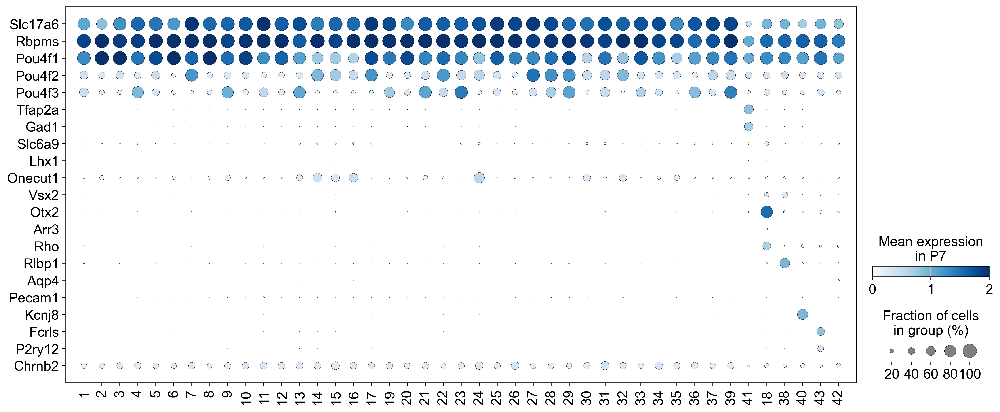

In [8]:
class_markers = ['Slc17a6', 'Rbpms', 'Pou4f1', 'Pou4f2', 'Pou4f3', 'Tfap2a', 'Gad1', 'Slc6a9', 'Lhx1', 'Onecut1', 'Vsx2', 'Otx2', 'Arr3', 'Rho', 'Rlbp1', 'Aqp4', 'Pecam1', 'Kcnj8', 'Fcrls', 'P2ry12', 'Chrnb2']
cluster_order = []
for i in range(len(adata_p7.obs['Cluster'].cat.categories)):
    cluster_order.append(str(i+1))
ending_order = ['41', '18', '38', '40', '43', '42']
for i in ending_order:
    cluster_order.remove(i)
    cluster_order.append(i)
plot_multidotplot([adata_p7], ['Blues'], groupby='Cluster', group_order=cluster_order, gene_order=class_markers, adata_names=['P7'])

In [9]:
p7_non_RGC_cluster_dict = {}
for i in ['41', '18', '38', '40', '43', '42']:
    sub_adata = adata_p7[adata_p7.obs['Cluster'] == i]
    run_umap(sub_adata)
    sc.tl.leiden(sub_adata)
    p7_non_RGC_cluster_dict[i] = sub_adata

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Completed 1 / 10 iteration(s).
Reach convergence after 1 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


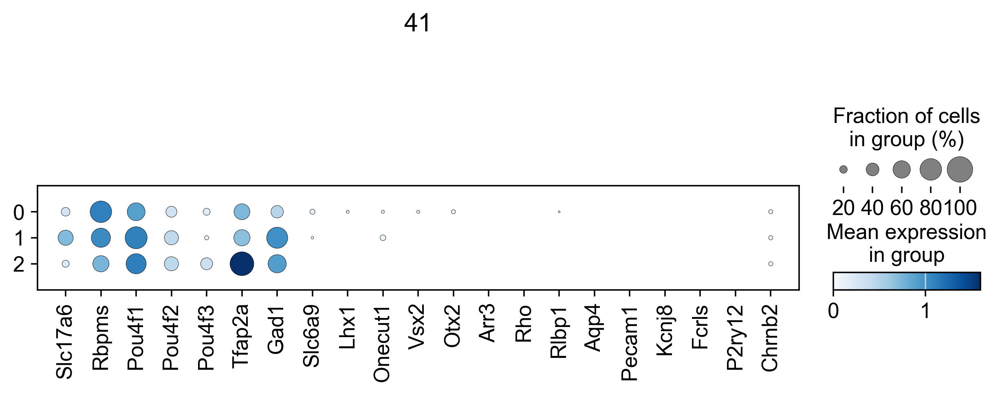

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


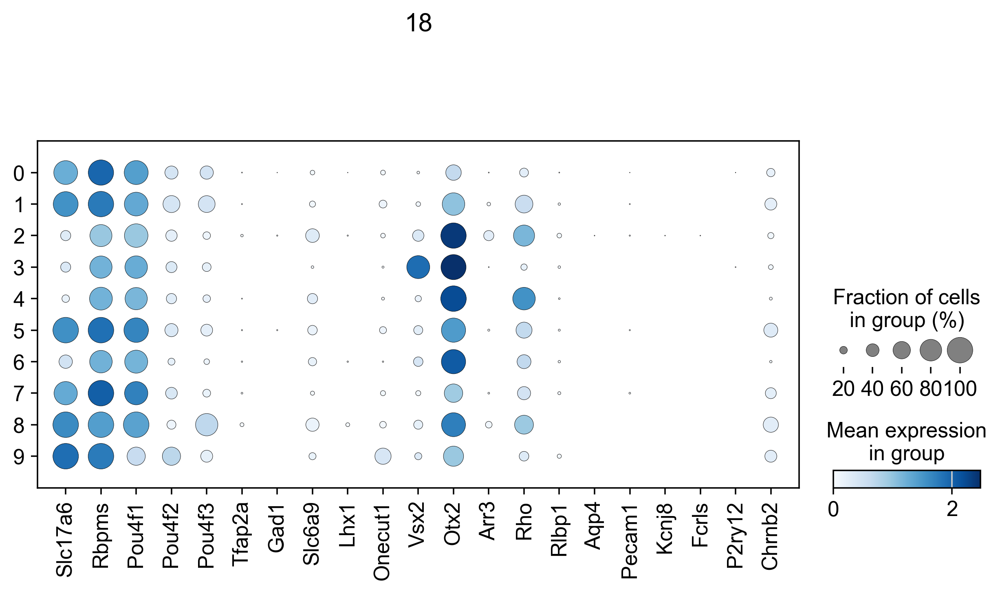

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


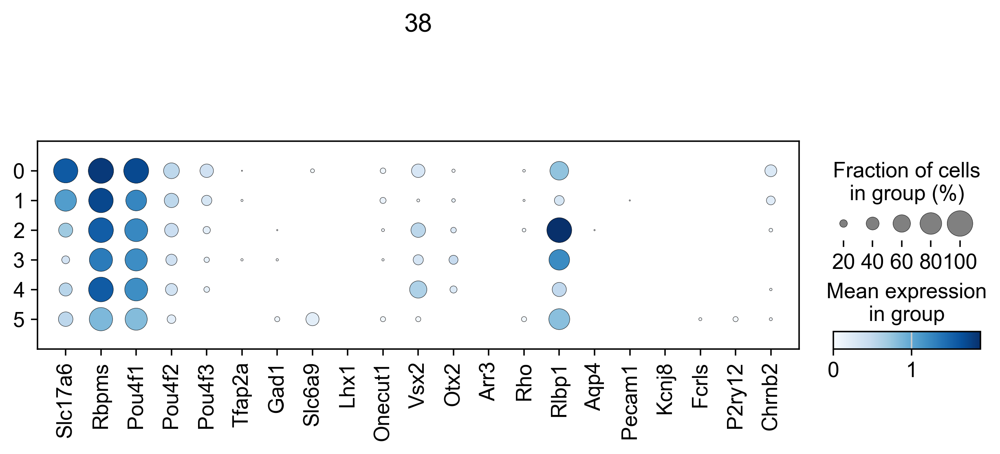

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


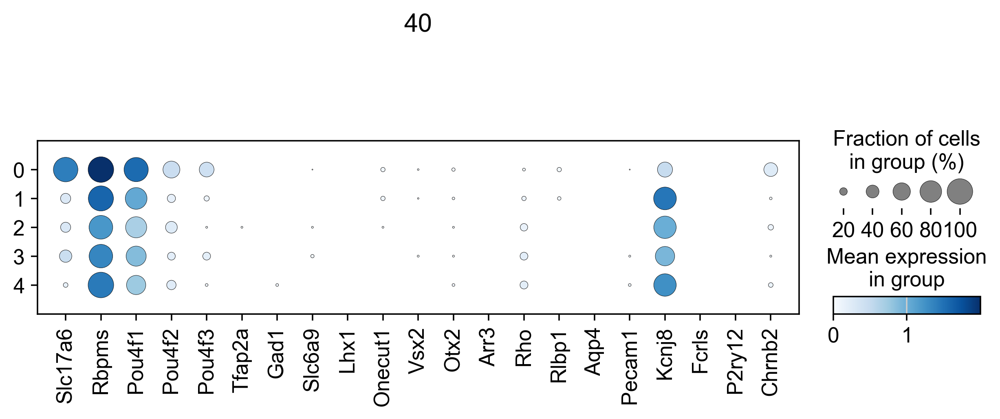

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


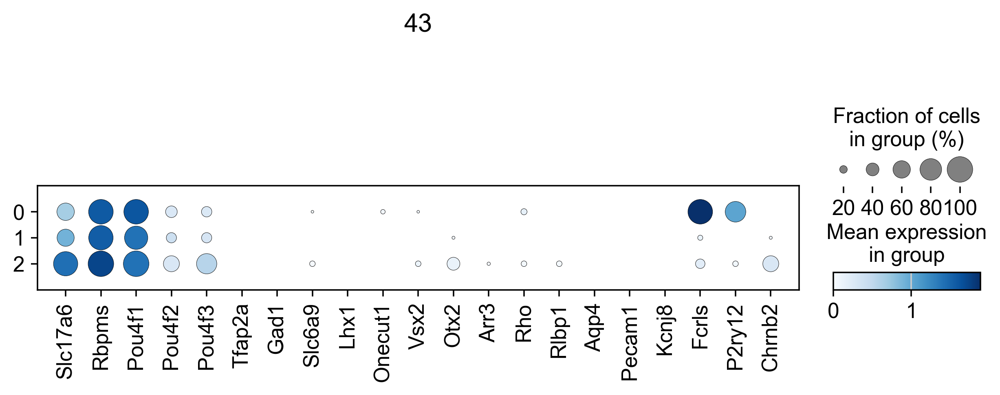

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


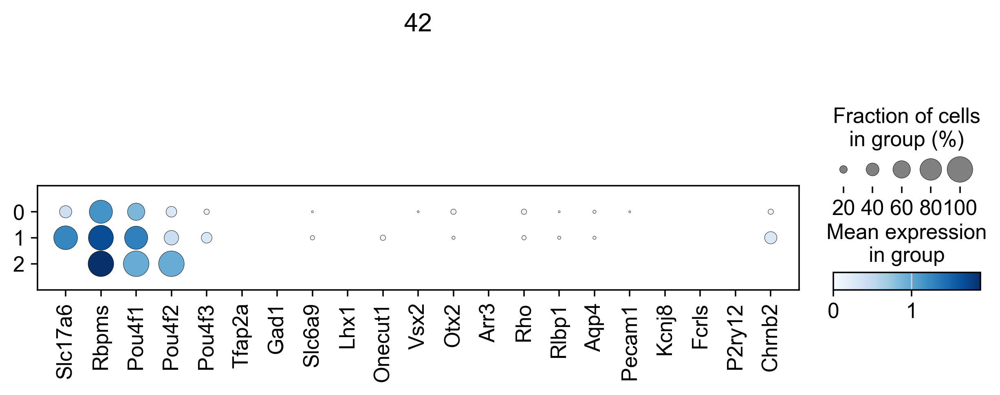

In [10]:
for i in p7_non_RGC_cluster_dict.keys():
    sc.pl.dotplot(p7_non_RGC_cluster_dict[i], class_markers, 'leiden', title=i, cmap='Blues')

In [11]:
p7_subclusters = {'41': {'41': ['0', '2'], '44': ['1']},
                  '18': {'18': ['3'], '45': ['0', '1', '5', '7', '8', '9'], '46': ['2', '4', '6']},
                  '38': {'38': ['2', '5'], '47': ['0', '1'], '48': ['3', '4']},
                  '40': {'40': ['1', '2', '3', '4'], '49': ['0']},
                  '43': {'43': ['0'], '50': ['1', '2']},
                  '42': {'42': ['0', '1', '2']}}

In [12]:
adata_p7_subclustered = adata_p7.copy()
p7_changing_barcodes = {}
for i in p7_non_RGC_cluster_dict.keys():
    sub_adata = p7_non_RGC_cluster_dict[i]
    subcluster_assignments = p7_subclusters[i]
    for j in subcluster_assignments.keys():
        barcodes = sub_adata[sub_adata.obs['leiden'].isin(subcluster_assignments[j])].obs.index
        for k in barcodes:
            p7_changing_barcodes[k] = j

p7_new_clusters = []
for i in range(len(adata_p7_subclustered.obs.index)):
    if adata_p7_subclustered.obs.index[i] in p7_changing_barcodes.keys():
        p7_new_clusters.append(p7_changing_barcodes[adata_p7_subclustered.obs.index[i]])
    else:
        p7_new_clusters.append(adata_p7_subclustered.obs['Cluster'][i])
adata_p7_subclustered.obs['Cluster'] = pd.Categorical(p7_new_clusters)

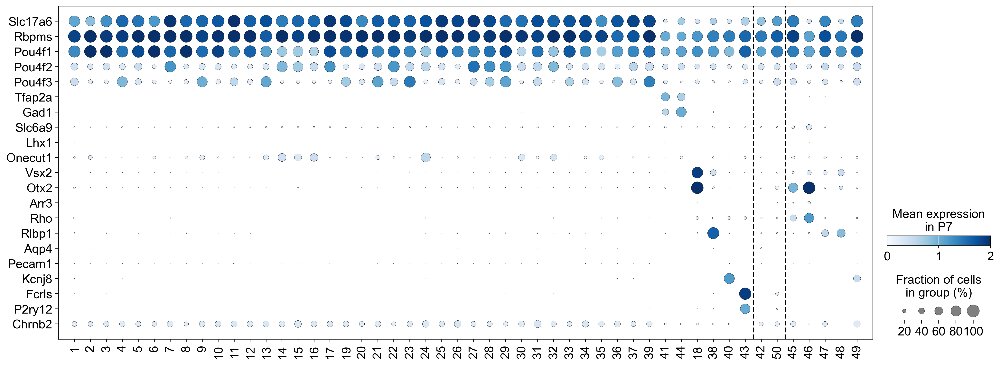

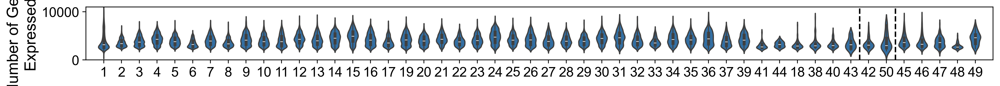

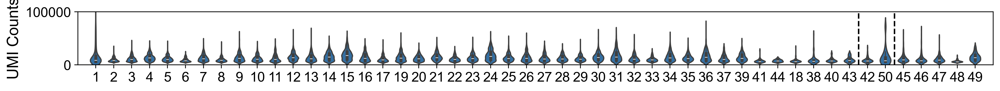

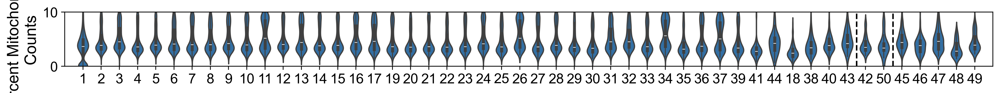

In [16]:
class_markers = ['Slc17a6', 'Rbpms', 'Pou4f1', 'Pou4f2', 'Pou4f3', 'Tfap2a', 'Gad1', 'Slc6a9', 'Lhx1', 'Onecut1', 'Vsx2', 'Otx2', 'Arr3', 'Rho', 'Rlbp1', 'Aqp4', 'Pecam1', 'Kcnj8', 'Fcrls', 'P2ry12', 'Chrnb2']
cluster_order = []
for i in range(len(adata_p7_subclustered.obs['Cluster'].cat.categories)):
    cluster_order.append(str(i+1))
ending_order = ['41', '44', '18', '38', '40', '43', '42', '50', '45', '46', '47', '48', '49']
for i in ending_order:
    cluster_order.remove(i)
    cluster_order.append(i)
plot_multidotplot([adata_p7_subclustered], ['Blues'], groupby='Cluster', group_order=cluster_order, gene_order=class_markers, adata_names=['P7'], save='supp1_p7_dotplot.svg', vline_locs=[43.5, 45.5])

p7_n_genes_list = []
p7_total_counts_list = []
p7_pct_counts_mt_list = []
for i in cluster_order:
    sub_adata = adata_p7_subclustered[adata_p7_subclustered.obs['Cluster'] == i]
    p7_n_genes_list.append(list(sub_adata.obs['n_genes']))
    p7_total_counts_list.append(list(sub_adata.obs['total_counts_raw']))
    p7_pct_counts_mt_list.append(list(sub_adata.obs['pct_counts_mt']))

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7_n_genes_list, color='#2171b5', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7_n_genes_list)), cluster_order)
plt.xlim([-1, len(p7_n_genes_list)])
plt.ylabel('Number of Genes\nExpressed')
plt.vlines(42.5, 0, 11000, color='black', ls='dashed')
plt.vlines(44.5, 0, 11000, color='black', ls='dashed')
plt.ylim([0,11000])
plt.grid(False)
plt.savefig('supp1_p7_n_counts_violinplot.svg')

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7_total_counts_list, color='#2171b5', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7_total_counts_list)), cluster_order)
plt.xlim([-1, len(p7_total_counts_list)])
plt.vlines(42.5, 0, 100000, color='black', ls='dashed')
plt.vlines(44.5, 0, 100000, color='black', ls='dashed')
plt.ylim([0,100000])
plt.ylabel('UMI Counts')
plt.grid(False)
plt.savefig('supp1_p7_total_counts_violinplot.svg')

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7_pct_counts_mt_list, color='#2171b5', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7_pct_counts_mt_list)), cluster_order)
plt.xlim([-1, len(p7_pct_counts_mt_list)])
plt.ylabel('Percent Mitochondrial\nCounts')
plt.vlines(42.5, 0, 10, color='black', ls='dashed')
plt.vlines(44.5, 0, 10, color='black', ls='dashed')
plt.ylim([0,10])
plt.grid(False)
plt.savefig('supp1_p7_pct_counts_mt_violinplot.svg')

# Classify β2KO P7 Cells

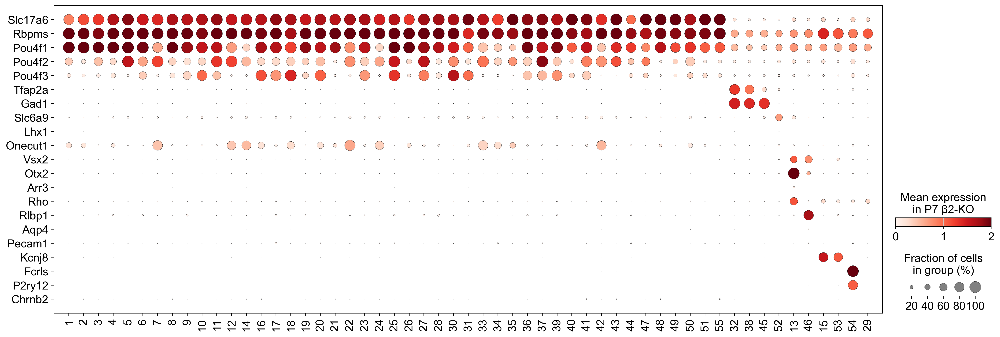

In [17]:
class_markers = ['Slc17a6', 'Rbpms', 'Pou4f1', 'Pou4f2', 'Pou4f3', 'Tfap2a', 'Gad1', 'Slc6a9', 'Lhx1', 'Onecut1', 'Vsx2', 'Otx2', 'Arr3', 'Rho', 'Rlbp1', 'Aqp4', 'Pecam1', 'Kcnj8', 'Fcrls', 'P2ry12', 'Chrnb2']
cluster_order = []
for i in range(len(adata_p7b2.obs['Cluster'].cat.categories)):
    cluster_order.append(str(i+1))
ending_order = ['32', '38', '45', '52', '13', '46', '15', '53', '54', '29']
for i in ending_order:
    cluster_order.remove(i)
    cluster_order.append(i)
plot_multidotplot([adata_p7b2], ['Reds'], groupby='Cluster', group_order=cluster_order, gene_order=class_markers, adata_names=['P7 β2-KO'])

In [18]:
p7b2_non_RGC_cluster_dict = {}
for i in ['32', '38', '45', '52', '13', '46', '15', '53', '54', '29']:
    sub_adata = adata_p7b2[adata_p7b2.obs['Cluster'] == i]
    print(i)
    print(len(sub_adata))
    run_umap(sub_adata)
    sc.tl.leiden(sub_adata)
    p7b2_non_RGC_cluster_dict[i] = sub_adata

32
279
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
38
230
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
45
154
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
52
71
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
13
460
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
46
123
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
15
444
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
53
61
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
54
42
computing PCA
    on highly variable genes
    with n_comps=41
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
29
297
computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


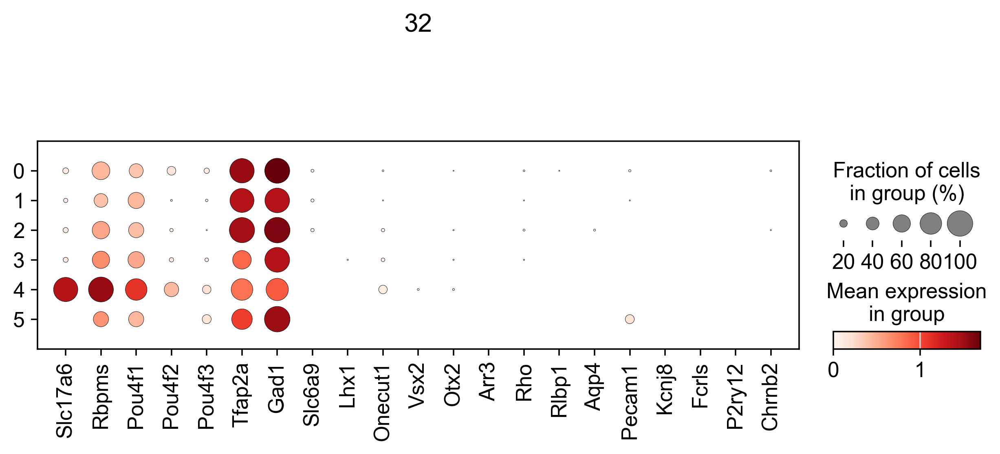

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


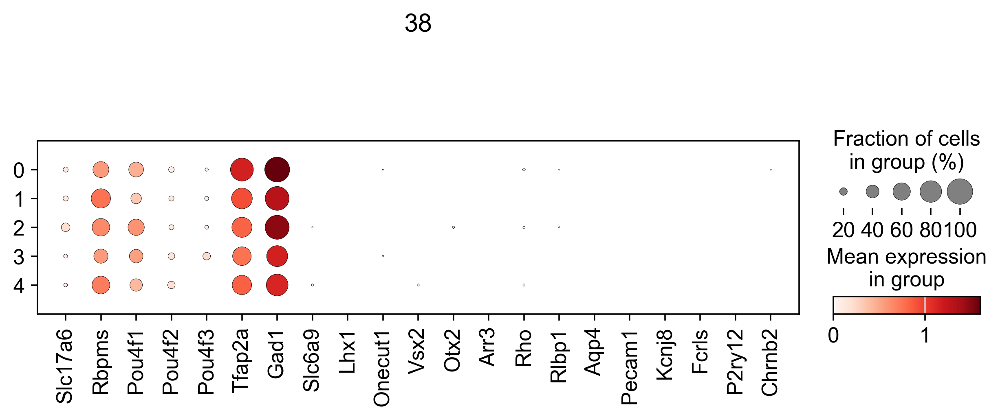

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


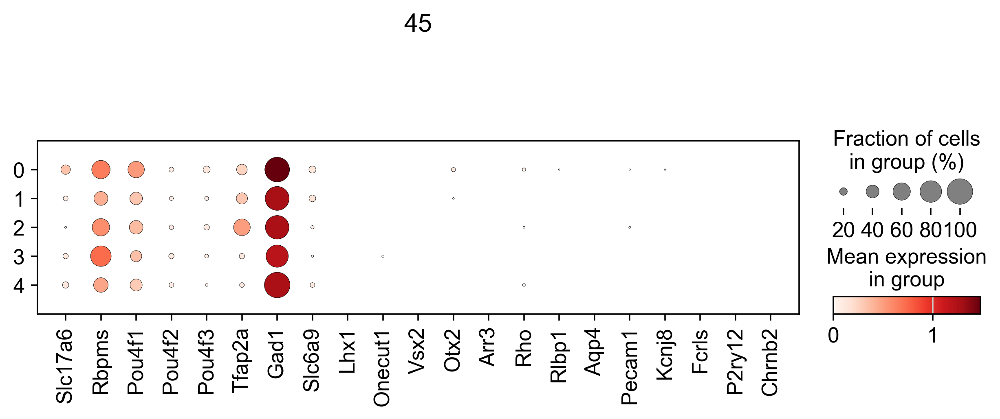

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


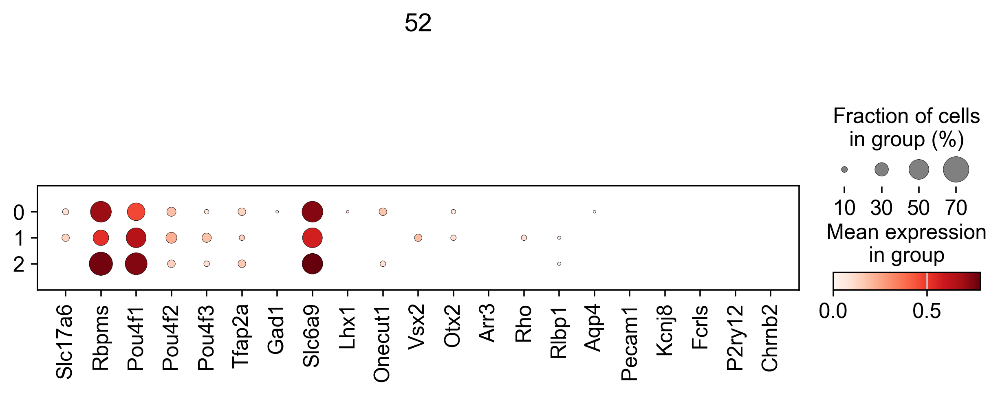

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


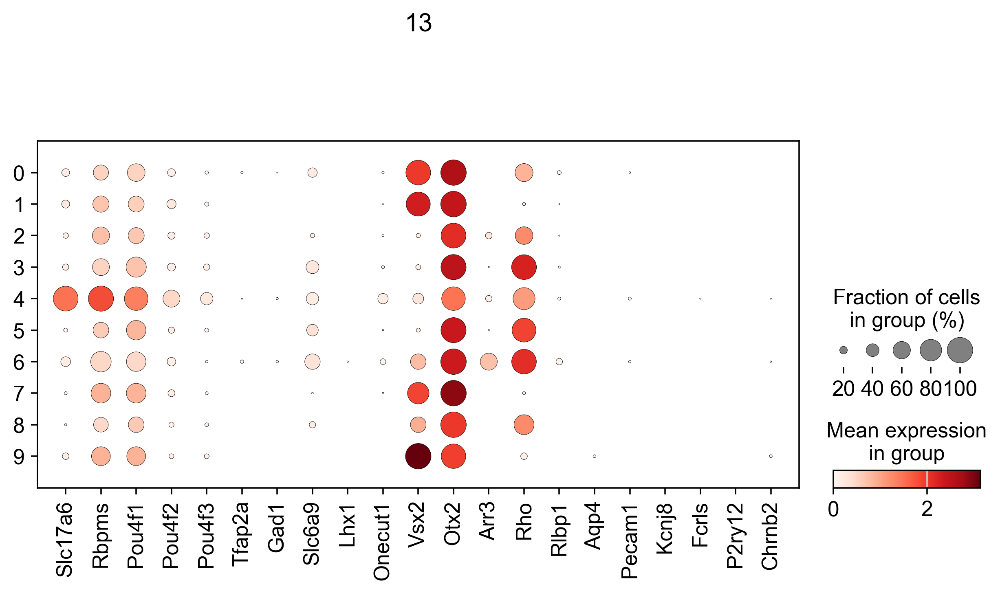

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


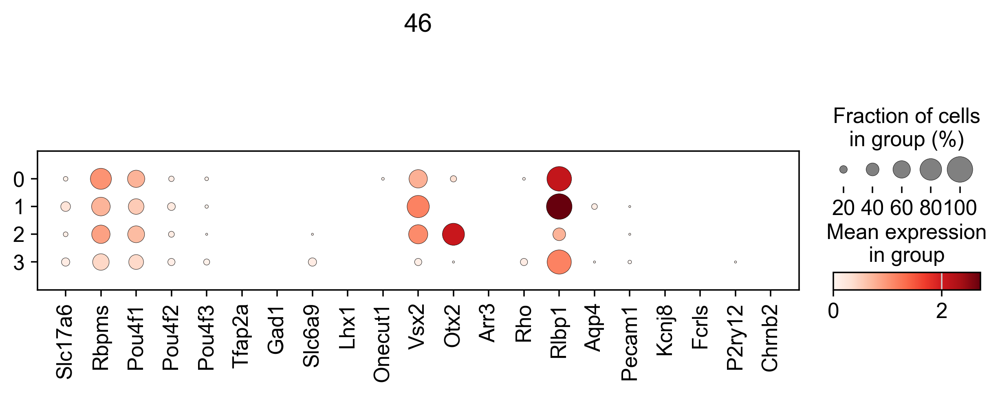

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


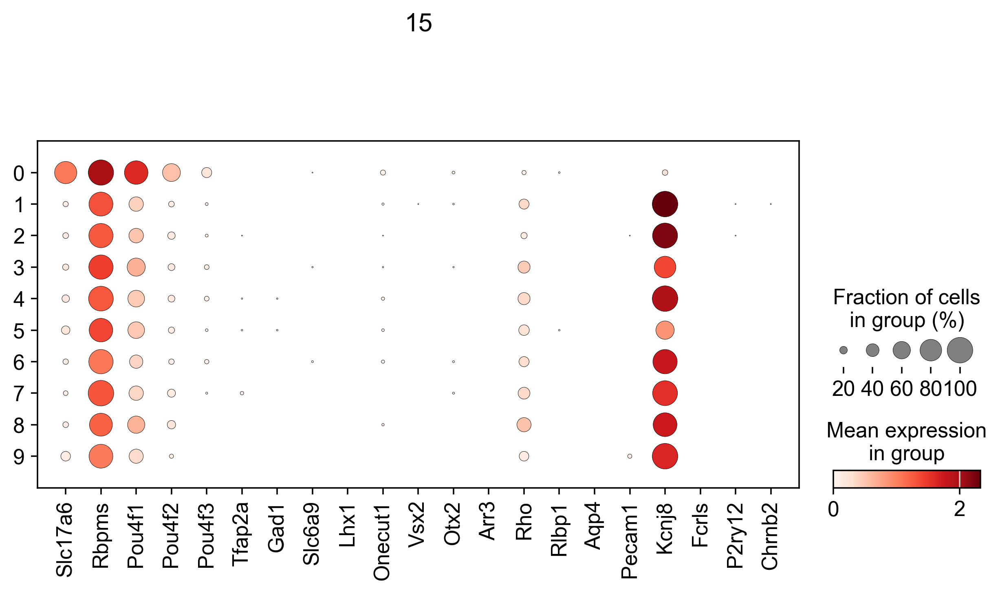

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


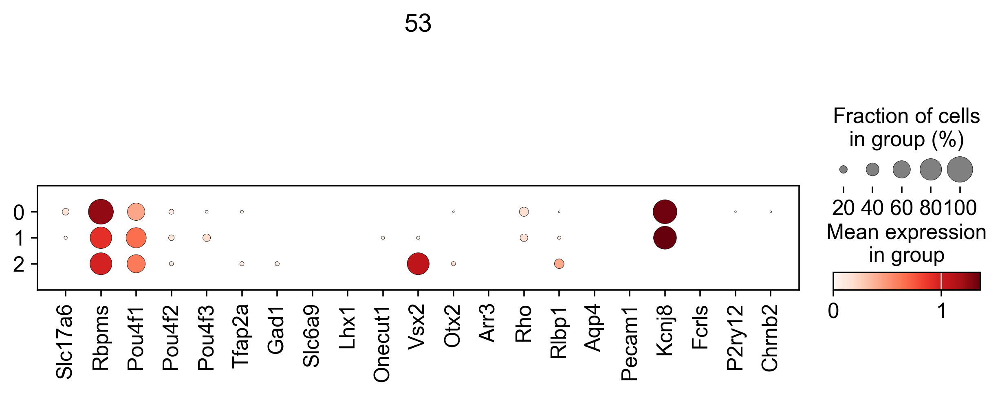

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


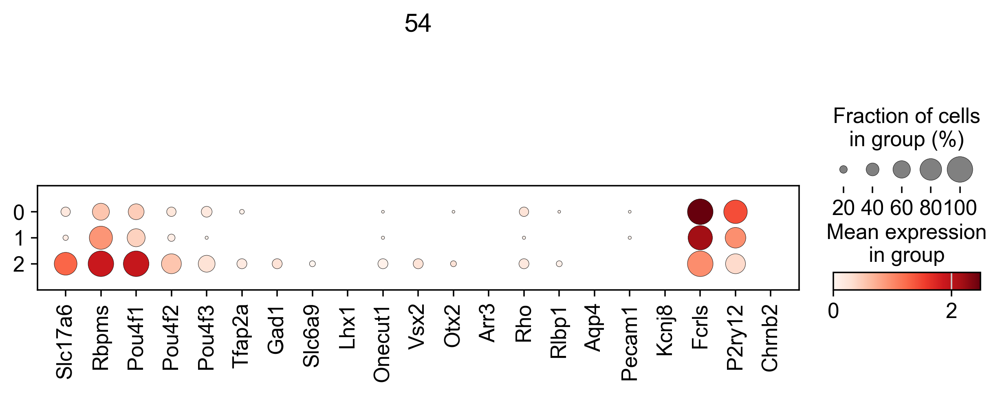

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


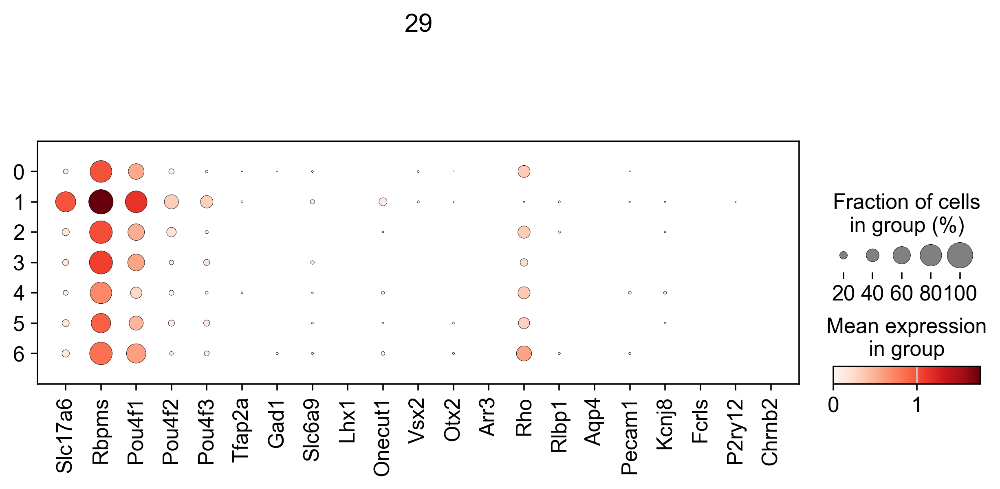

In [19]:
for i in p7b2_non_RGC_cluster_dict.keys():
    sc.pl.dotplot(p7b2_non_RGC_cluster_dict[i], class_markers, 'leiden', title=i)

In [20]:
p7b2_subclusters = {'32': {'32': ['0', '1', '2', '3', '5'], '56': ['4']},
                    '38': {'38': ['0', '1', '2', '3', '4']},
                    '45': {'45': ['0', '1', '2', '3', '4']},
                    '52': {'29': ['0', '1', '2']},
                    '13': {'13': ['1', '7', '9'], '57': ['0', '2', '3', '5', '6', '8'], '58': ['4']},
                    '46': {'46': ['0', '1', '3'], '59': ['2']},
                    '15': {'15': ['1', '2', '3', '4', '5', '6', '7', '8', '9'], '60': ['0']},
                    '53': {'53': ['0', '1'], '61': ['2']},
                    '54': {'54': ['0', '1'], '52': ['2']},
                    '29': {'29': ['0', '1', '2', '3', '4', '5', '6']}}

In [21]:
adata_p7b2_subclustered = adata_p7b2.copy()
p7b2_changing_barcodes = {}
for i in p7b2_non_RGC_cluster_dict.keys():
    # print('--------')
    # print(i)
    sub_adata = p7b2_non_RGC_cluster_dict[i]
    subcluster_assignments = p7b2_subclusters[i]
    # print(len(sub_adata))
    for j in subcluster_assignments.keys():
        # print('-', j, '-')
        barcodes = sub_adata[sub_adata.obs['leiden'].isin(subcluster_assignments[j])].obs.index
        # print(len(barcodes))
        for k in barcodes:
            p7b2_changing_barcodes[k] = j

p7b2_new_clusters = []
for i in range(len(adata_p7b2_subclustered.obs.index)):
    if adata_p7b2_subclustered.obs.index[i] in p7b2_changing_barcodes.keys():
        p7b2_new_clusters.append(p7b2_changing_barcodes[adata_p7b2_subclustered.obs.index[i]])
    else:
        p7b2_new_clusters.append(adata_p7b2_subclustered.obs['Cluster'][i])
adata_p7b2_subclustered.obs['Cluster'] = pd.Categorical(p7b2_new_clusters)

In [22]:
for i in p7b2_subclusters.keys():
    p7b2_changing_barcodes

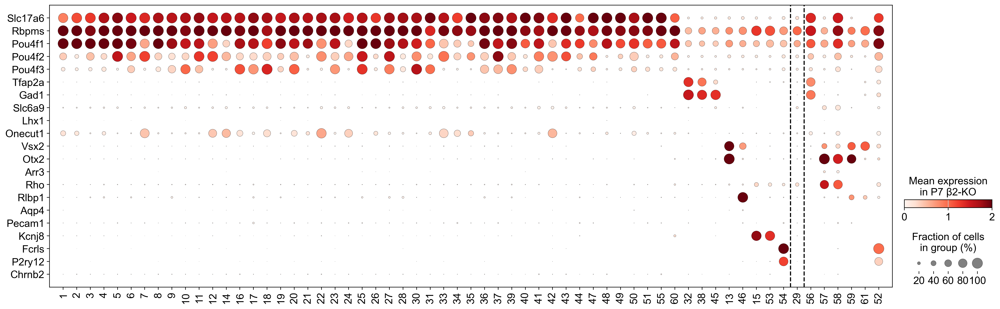

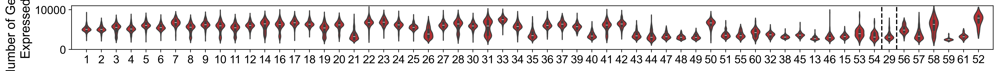

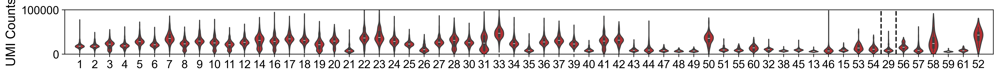

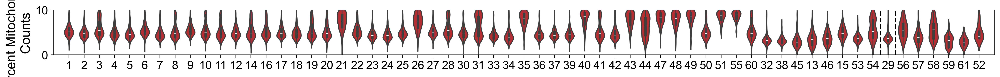

In [33]:
class_markers = ['Slc17a6', 'Rbpms', 'Pou4f1', 'Pou4f2', 'Pou4f3', 'Tfap2a', 'Gad1', 'Slc6a9', 'Lhx1', 'Onecut1', 'Vsx2', 'Otx2', 'Arr3', 'Rho', 'Rlbp1', 'Aqp4', 'Pecam1', 'Kcnj8', 'Fcrls', 'P2ry12', 'Chrnb2']
cluster_order = []
for i in range(len(adata_p7b2_subclustered.obs['Cluster'].cat.categories)):
    cluster_order.append(str(i+1))
ending_order = ['60', '32', '38', '45', '13', '46', '15', '53', '54', '29', '56', '57', '58', '59', '61', '52']
for i in ending_order:
    cluster_order.remove(i)
    cluster_order.append(i)
plot_multidotplot([adata_p7b2_subclustered], ['Reds'], groupby='Cluster', group_order=cluster_order, gene_order=class_markers, adata_names=['P7 β2-KO'], save='supp1_b2_dotplot.svg', vline_locs=[54.5, 55.5])
plt.vlines(46.5, 0, 7200, color='black', ls='dashed')
p7b2_n_genes_list = []
p7b2_total_counts_list = []
p7b2_pct_counts_mt_list = []
for i in cluster_order:
    sub_adata = adata_p7b2_subclustered[adata_p7b2_subclustered.obs['Cluster'] == i]
    p7b2_n_genes_list.append(list(sub_adata.obs['n_genes']))
    p7b2_total_counts_list.append(list(sub_adata.obs['total_counts_raw']))
    p7b2_pct_counts_mt_list.append(list(sub_adata.obs['pct_counts_mt']))

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7b2_n_genes_list, color='#cb181d', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7b2_n_genes_list)), cluster_order)
plt.xlim([-1, len(p7b2_n_genes_list)])
plt.vlines(53.5, 0, 11000, color='black', ls='dashed')
plt.vlines(54.5, 0, 11000, color='black', ls='dashed')
plt.ylim([0,11000])
plt.ylabel('Number of Genes\nExpressed')
plt.grid(False)
plt.savefig('supp1_p7b2_n_counts_violinplot.svg')

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7b2_total_counts_list, color='#cb181d', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7b2_total_counts_list)), cluster_order)
plt.xlim([-1, len(p7b2_total_counts_list)])
plt.vlines(53.5, 0, 100000, color='black', ls='dashed')
plt.vlines(54.5, 0, 100000, color='black', ls='dashed')
plt.ylim([0,100000])
plt.ylabel('UMI Counts')
plt.grid(False)
plt.savefig('supp1_p7b2_total_counts_violinplot.svg')

fig, ax = plt.subplots(figsize=(len(cluster_order)/3, 1))
sns.violinplot(p7b2_pct_counts_mt_list, color='#cb181d', width=0.6, inner_kws=dict(box_width=3), density_norm='width')
# sns.stripplot(p7b2_n_genes_list, color='black', alpha=0.8, size=2)
plt.xticks(np.arange(len(p7b2_pct_counts_mt_list)), cluster_order)
plt.xlim([-1, len(p7b2_pct_counts_mt_list)])
plt.ylabel('Percent Mitochondrial\nCounts')
plt.vlines(53.5, 0, 10, color='black', ls='dashed')
plt.vlines(54.5, 0, 10, color='black', ls='dashed')
plt.ylim([0,10])
plt.grid(False)
plt.savefig('supp1_p7b2_pct_counts_mt_violinplot.svg')

# Visualization

In [58]:
run_umap(adata_p7_subclustered)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


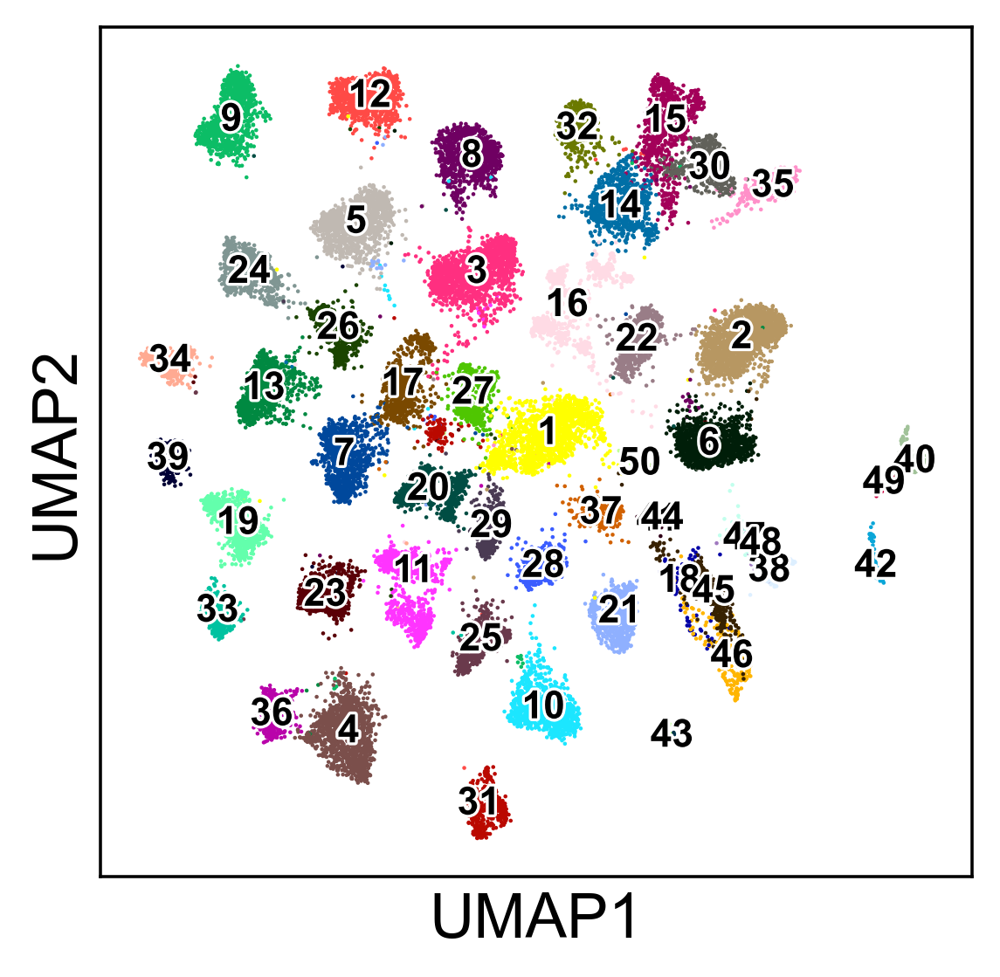

In [24]:
sc.pl.umap(adata_p7_subclustered, color='Cluster', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='supp1_p7_umap.svg')

In [60]:
run_umap(adata_p7b2_subclustered)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


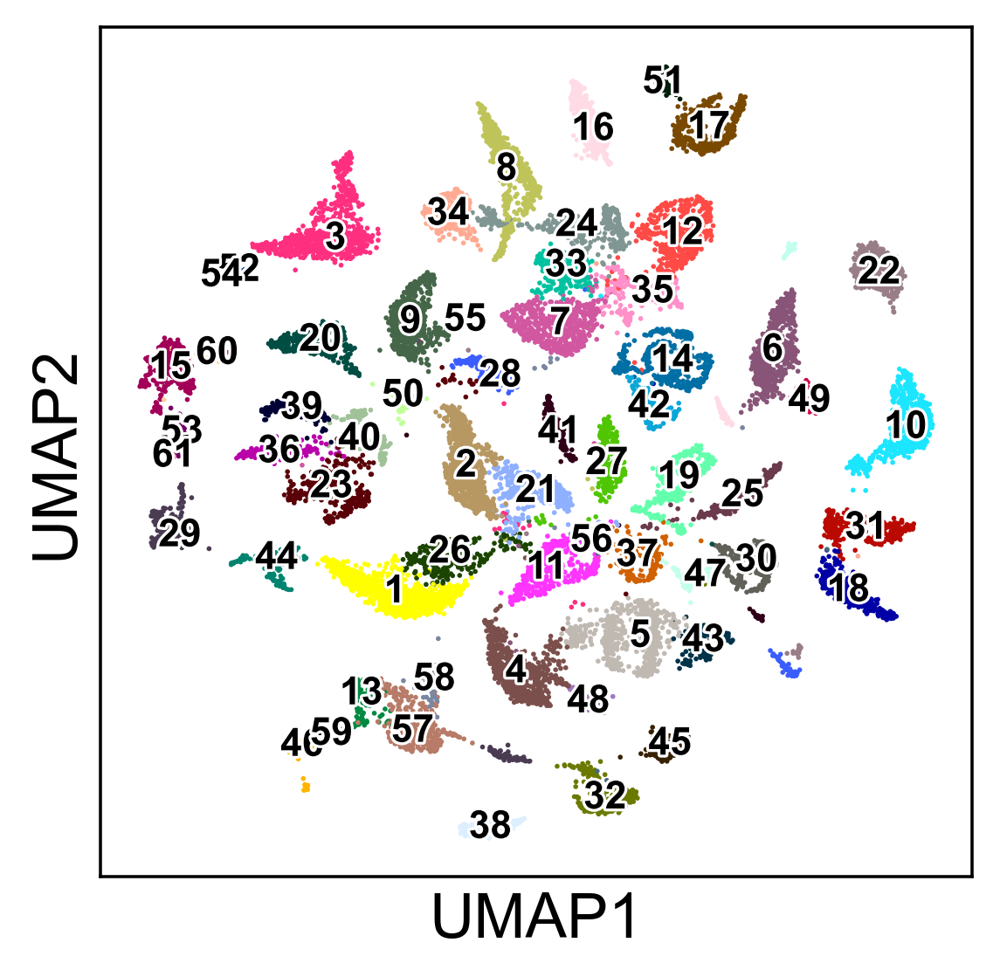

In [25]:
sc.pl.umap(adata_p7b2_subclustered, color='Cluster', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='supp1_p7b2_umap.svg')

In [62]:
p7_cluster_assignments = {'RGC': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39],
                          'GABA-AC': [41, 44],
                          'BC': [18],
                          'Müller_Glia': [38],
                          'Endo': [40],
                          'Microglia': [43],
                          'Debris': [42, 50],
                          'Doublet': [45, 46, 47, 48, 49]}

In [63]:
p7b2_cluster_assignments = {'RGC': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 55, 60], 
                            'GABA-AC': [32, 38, 45],
                            'BC': [13],
                            'Müller_Glia': [46],
                            'Endo': [15, 53],
                            'Microglia': [54],
                            'Debris': [29],
                            'Doublet': [56, 57, 58, 59, 61, 52]}

In [64]:
adata_p7_subclustered.obs['Class'] = pd.Categorical(len(adata_p7_subclustered)*['Blank_Class'])
new_categories = [i for i in list(p7_cluster_assignments.keys()) if i not in adata_p7_subclustered.obs['Class'].cat.categories]
adata_p7_subclustered.obs['Class'] = adata_p7_subclustered.obs['Class'].cat.add_categories(new_categories)
for i in p7_cluster_assignments.keys():
    clusters = [str(x) for x in p7_cluster_assignments[i]]
    adata_p7_subclustered.obs.loc[adata_p7_subclustered.obs['Cluster'].isin(clusters), 'Class'] = i

In [65]:
adata_p7b2_subclustered.obs['Class'] = pd.Categorical(len(adata_p7b2_subclustered)*['Blank_Class'])
new_categories = [i for i in list(p7b2_cluster_assignments.keys()) if i not in adata_p7b2_subclustered.obs['Class'].cat.categories]
adata_p7b2_subclustered.obs['Class'] = adata_p7b2_subclustered.obs['Class'].cat.add_categories(new_categories)
for i in p7b2_cluster_assignments.keys():
    clusters = [str(x) for x in p7b2_cluster_assignments[i]]
    adata_p7b2_subclustered.obs.loc[adata_p7b2_subclustered.obs['Cluster'].isin(clusters), 'Class'] = i

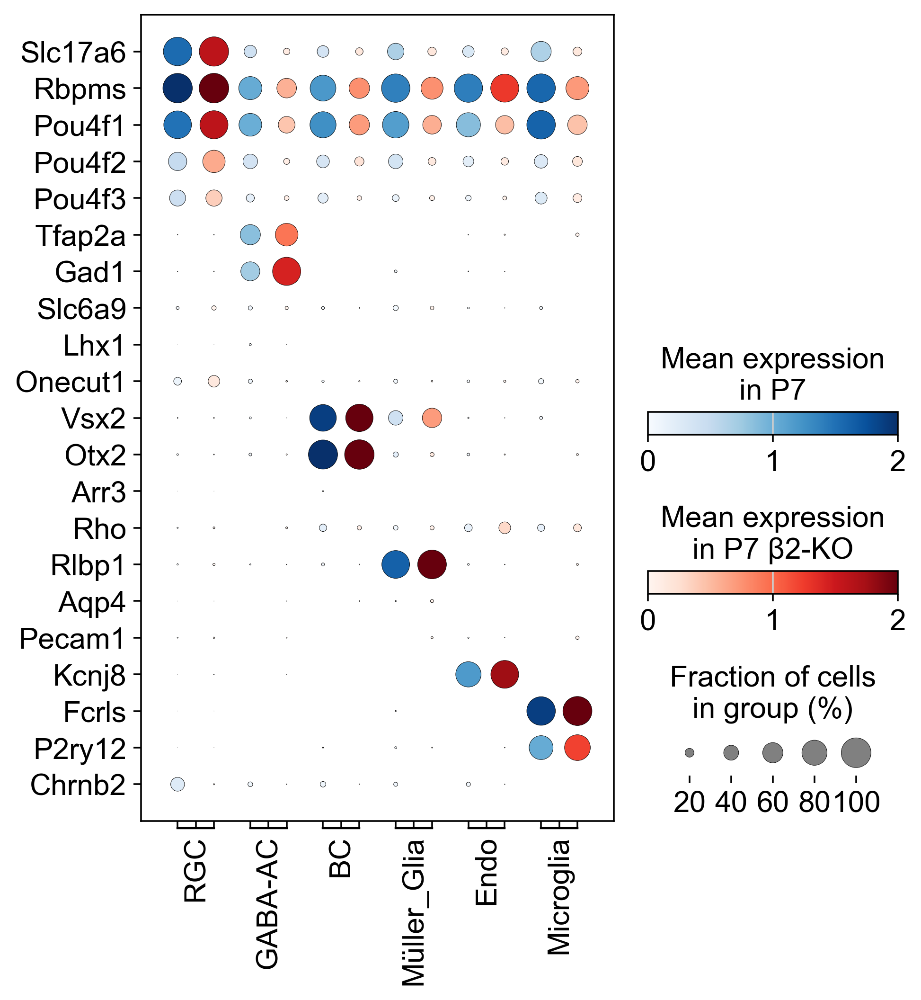

In [66]:
plot_multidotplot([adata_p7_subclustered, adata_p7b2_subclustered], ['Blues', 'Reds'], groupby='Class', group_order=class_order, gene_order=class_markers, adata_names=['P7', 'P7 β2-KO'], stack='h')

# Filter Non-RGCs

In [67]:
adata_p7_RGC = adata_p7_subclustered[adata_p7_subclustered.obs['Class'] == 'RGC']

In [68]:
adata_p7b2_RGC = adata_p7b2_subclustered[adata_p7b2_subclustered.obs['Class'] == 'RGC']

In [69]:
run_umap(adata_p7_RGC)
sc.tl.leiden(adata_p7_RGC, resolution=1.1)
cluster_nums = []
for i in range(adata_p7_RGC.shape[0]):
    cluster_num = int(adata_p7_RGC.obs.leiden[i])+1
    cluster_num = str(cluster_num)
    cluster_nums.append(cluster_num)

adata_p7_RGC.obs['Cluster'] = pd.Categorical(cluster_nums)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
running Leiden clustering
    finished: found 40 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


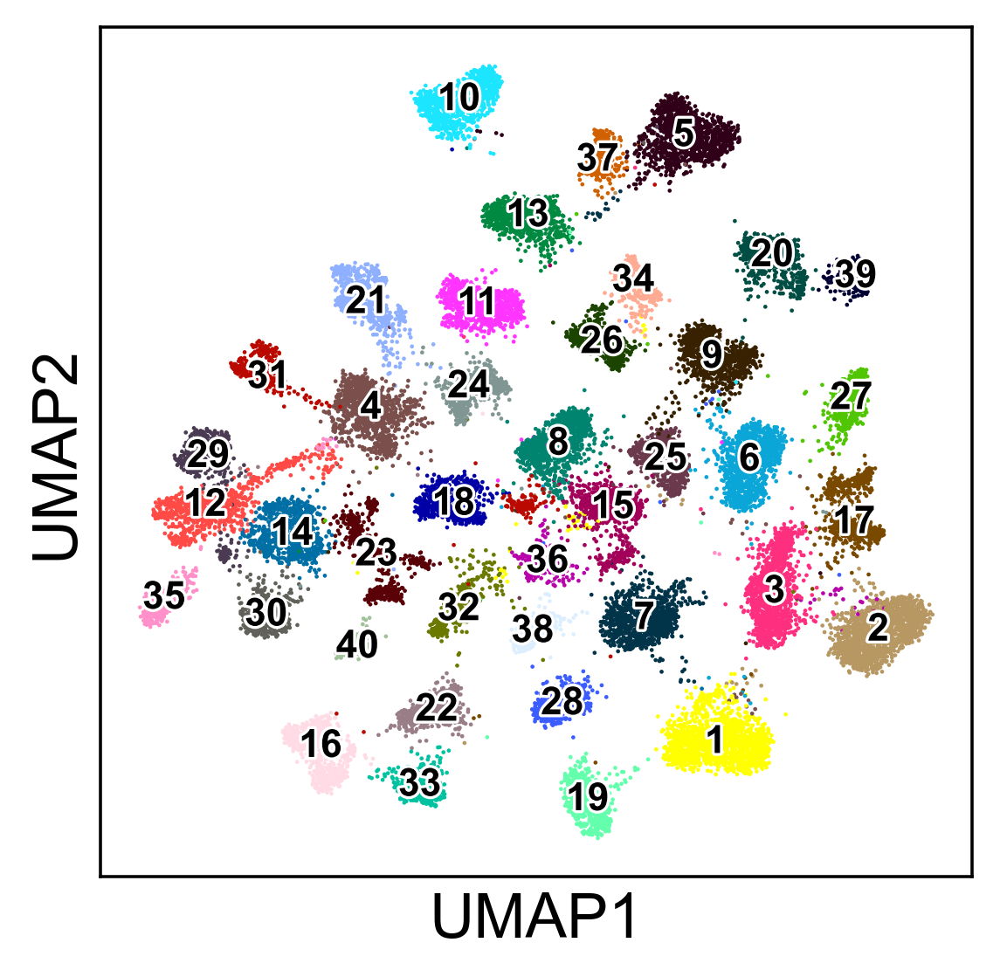

In [70]:
sc.pl.umap(adata_p7_RGC, color='Cluster', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='')

In [73]:
run_umap(adata_p7b2_RGC)
sc.tl.leiden(adata_p7b2_RGC, resolution=1.1)
cluster_nums = []
for i in range(adata_p7b2_RGC.shape[0]):
    cluster_num = int(adata_p7b2_RGC.obs.leiden[i])+1
    cluster_num = str(cluster_num)
    cluster_nums.append(cluster_num)

adata_p7b2_RGC.obs['Cluster'] = pd.Categorical(cluster_nums)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
running Leiden clustering
    finished: found 52 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


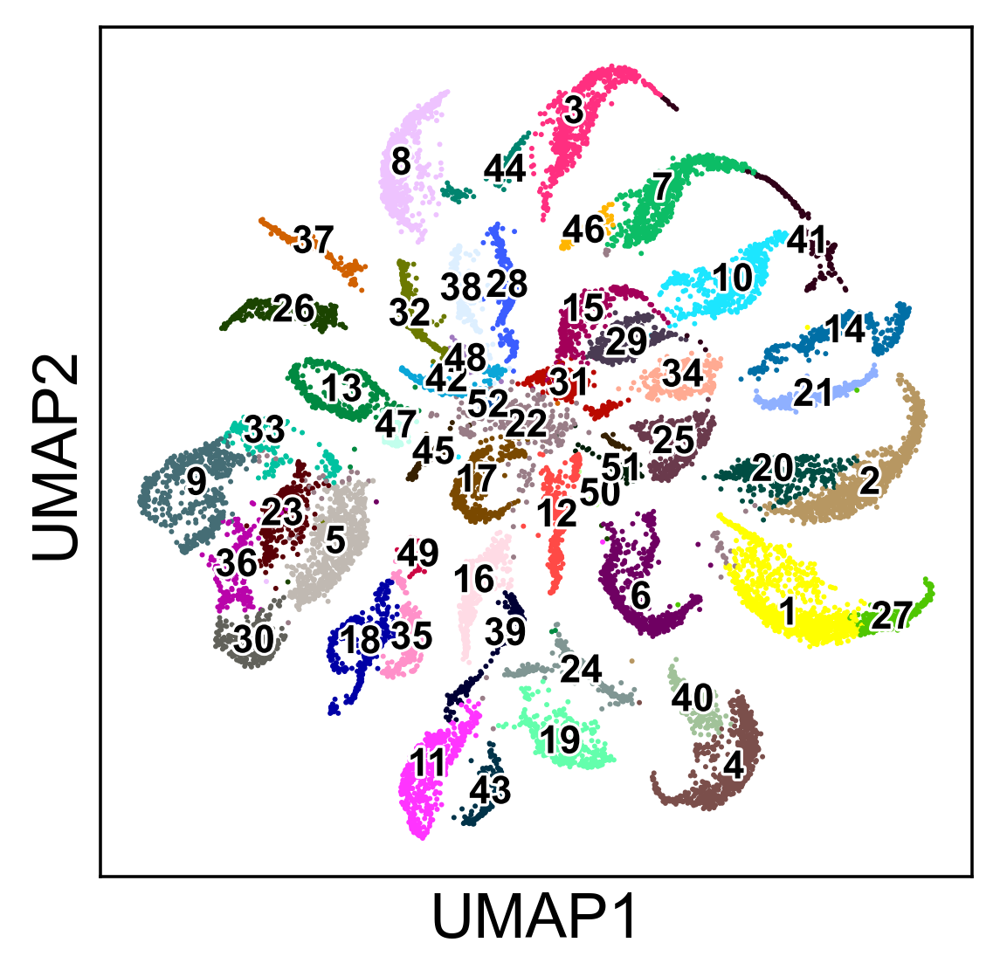

In [74]:
sc.pl.umap(adata_p7b2_RGC, color='Cluster', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='')

In [77]:
adata_p7_RGC.write('path/to/adatas/p7_adata_filtered.h5ad')

In [78]:
adata_p7b2_RGC.write('path/to/adatas/p7b2_adata_filtered.h5ad')

In [79]:
adata_p7_subclustered.write('path/to/adatas/p7_adata_classified.h5ad')

In [80]:
adata_p7b2_subclustered.write('path/to/adatas/p7b2_adata_classified.h5ad')